# Setup

중요: 로컬 머신에서 실행 중인 경우 [설치 지침](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2.md)을 따르세요. 이 노트북에는 Colab에서 실행하는 데 필요한 것만 포함되어 있습니다.

### 00 LabelIMG 도구로 생성한 XML을 CVS로 취합함 (images/train , images/test)

In [1]:
!00_xml_to_csv.bat


c:\tensorflow\workspace\wall_faster_rcnn>python ../../scripts/preprocessing/xml_to_csv.py 
Successfully converted xml to csv.
Successfully converted xml to csv.


### 01 라벨링 정보로 tfrecord파일을 생성함

In [2]:
!01_generate_record.bat


c:\tensorflow\workspace\wall_faster_rcnn>python ../../models/research/object_detection/generate_tfrecord.py --csv_input=images/train_labels.csv --image_dir=images/train --output_path=annotations/train.record 
Successfully created the TFRecords: c:\tensorflow\workspace\wall_faster_rcnn\annotations/train.record

c:\tensorflow\workspace\wall_faster_rcnn>python ../../models/research/object_detection/generate_tfrecord.py --csv_input=images/test_labels.csv --image_dir=images/test --output_path=annotations/test.record 
Successfully created the TFRecords: c:\tensorflow\workspace\wall_faster_rcnn\annotations/test.record


### 02 라벨링 분류 파일을 생성함

In [3]:
!02_generate_labelmap.bat


c:\tensorflow\workspace\wall_faster_rcnn>python ../../scripts/preprocessing/generate_labelmap.py 


### 03 테스트 이미지의 학습을 진행함

In [4]:
!03_faster_rcnn_training_model.bat

2022-10-25 09:56:01.536477: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-25 09:56:01.896469: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3969 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:01:00.0, compute capability: 7.5
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1025 09:56:02.020818 27580 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I1025 09:56:02.022816 27580 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Ma


c:\tensorflow\workspace\wall_faster_rcnn>python ../../models/research/object_detection/model_main_tf2.py --num_workers=1 --model_dir=models/my_faster_rcnn_resnet50_v1_fpn --pipeline_config_path=models/my_faster_rcnn_resnet50_v1_fpn/pipeline.config 


### 04 학습된 모델을 내보내기로 진행함

In [5]:
!05_faster_rcnn_exporter_model.bat


c:\tensorflow\workspace\wall_faster_rcnn>python ../../models/research/object_detection/exporter_main_v2.py --input_type image_tensor --pipeline_config_path models/my_faster_rcnn_resnet50_v1_fpn/pipeline.config --trained_checkpoint_dir models/my_faster_rcnn_resnet50_v1_fpn/ --output_directory exported-models/my_faster_rcnn_model 


2022-10-25 10:27:20.154078: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-25 10:27:20.565136: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3969 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2060, pci bus id: 0000:01:00.0, compute capability: 7.5
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W1025 10:27:20.798101 21904 deprecation.py:610] From c:\Users\Administrator\AppData\Local\Programs\Python\Python39\lib\site-packages\tensorflow\python\autograph

### 파이선 모듈 임포트 진행

In [6]:
import numpy as np
import os
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

개체 감지 모듈을 가져옵니다.

In [7]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

패치:

In [8]:
print("파이선 버전 >>> ")
!python --version
print("텐서플로우 버전 : ", tf.__version__)
print("GPU 장치정보 : ", tf.config.list_physical_devices('GPU'))
from tensorflow.python.eager import context
print("GPU 갯수 : ", context.num_gpus())
print("CUDA 라이브러리 버전 >>>")
!nvcc --version

파이선 버전 >>> 
Python 3.9.1
텐서플로우 버전 :  2.8.0
GPU 장치정보 :  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU 갯수 :  1
CUDA 라이브러리 버전 >>>
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_22:08:44_Pacific_Standard_Time_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0


In [9]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

# 모델 준비

## Faster R-CNN

`pre-trained-models`에서는 "faster R-CNN" 모델을 사용합니다. 
외부에서 실행할 수 있는 다른 모델 목록은 [검출 모델](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md)을 참조

## Loader
웹경로에서 로드하는 코드를 수정해서 로컬의 학습 모델을 로드함

In [10]:
def local_load_model(model_dir):
  # base_url = 'http://download.tensorflow.org/models/object_detection/'
  # model_file = model_name + '.tar.gz'
  # model_dir = tf.keras.utils.get_file(
  #   fname=model_name, 
  #   origin=base_url + model_file,
  #   untar=True)

  # model_dir = pathlib.Path(model_dir)/"saved_model"
  model = tf.saved_model.load(str(model_dir))

  return model

## 라벨 맵 로드

In [11]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

# 탐지

객체 감지 모델 로드:

In [12]:
model_dir = "exported-models/my_faster_rcnn_model/saved_model/"
detection_model = local_load_model(model_dir)

로드한 모델의 주요 정보를 조회함.

In [13]:
detection_model.signatures['serving_default'].output_dtypes

{'raw_detection_boxes': tf.float32,
 'raw_detection_scores': tf.float32,
 'detection_boxes': tf.float32,
 'detection_multiclass_scores': tf.float32,
 'num_detections': tf.float32,
 'detection_scores': tf.float32,
 'detection_classes': tf.float32,
 'detection_anchor_indices': tf.float32}

In [14]:
detection_model.signatures['serving_default'].output_shapes

{'raw_detection_boxes': TensorShape([1, 300, 4]),
 'raw_detection_scores': TensorShape([1, 300, 86]),
 'detection_boxes': TensorShape([1, 300, 4]),
 'detection_multiclass_scores': TensorShape([1, 300, 86]),
 'num_detections': TensorShape([1]),
 'detection_scores': TensorShape([1, 300]),
 'detection_classes': TensorShape([1, 300]),
 'detection_anchor_indices': TensorShape([1, 300])}

입력한 이미지에서 주요 객체를 탐지를 예측하는 함수

In [15]:
def run_inference_for_single_image(model, image):

  # 입력은 텐서여야 하며 `tf.convert_to_tensor`를 사용하여 변환합니다.
  input_tensor = tf.convert_to_tensor(image)

  # 모델은 이미지 배치를 예상하므로 `tf.newaxis`를 사용하여 축을 추가합니다.
  input_tensor = input_tensor[tf.newaxis,...]

  # 추론 (inference) 실행
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # 모든 출력은 배치 텐서입니다.
  # numpy 배열로 변환하고 인덱스 [0]을 사용하여 배치 차원을 제거합니다.
  # 우리는 첫 번째 num_detections에만 관심이 있습니다.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, : num_detections].numpy() for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes는 정수여야 합니다.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # 마스크가 있는 모델 처리:
  if 'detection_masks' in output_dict:
    # bbox 마스크를 이미지 크기로 재구성합니다.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
              image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

각 테스트 이미지에서 실행하고 결과를 표시합니다.

In [16]:
def show_inference(model, image_path):
  # 이미지의 배열 기반 표현은 나중에 준비하기 위해 사용됩니다. 상자와 레이블이 있는 결과 이미지입니다.
  image_np = np.array(Image.open(image_path))
  # 실제 감지.
  output_dict = run_inference_for_single_image(model, image_np)
  # 탐지 결과의 시각화.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      max_boxes_to_draw=1000,
      min_score_thresh=.5,      
      line_thickness=3,
      )

  display(Image.fromarray(image_np))
  print(image_np.shape)

In [17]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
import pathlib

PATH_TO_TEST_IMAGES_DIR = pathlib.Path('test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[WindowsPath('test_images/15_98V_GA1_평면도 기본형_photoinfra_1363570654840.jpg'),
 WindowsPath('test_images/2_101A_GA1_평면도 기본형_GW70765_1330928342036.jpg'),
 WindowsPath('test_images/2_108_GA1_평면도 기본형_GW70427_1334732753759.jpg'),
 WindowsPath('test_images/2_115B_GA1_평면도 기본형_GW70726_1330064263693.jpg'),
 WindowsPath('test_images/2_140_GA1_평면도 기본형_photoinfra_1623144723127.jpg'),
 WindowsPath('test_images/2_152_GA1_평면도 기본형_photoinfra_1623198571628.jpg'),
 WindowsPath('test_images/2_161_GA1_평면도 기본형_GW70711_1332493957416.jpg'),
 WindowsPath('test_images/2_166_GA1_평면도 기본형_GW70765_1330931668575.jpg'),
 WindowsPath('test_images/2_75C_GA1_평면도 기본형_GW70711_1334648187941.jpg'),
 WindowsPath('test_images/3_108A_GA1_평면도 기본형_GW70765_1330931408103.jpg'),
 WindowsPath('test_images/3_109B_GA1_평면도 기본형_GW70427_1334734929701.jpg'),
 WindowsPath('test_images/3_112B_GA1_평면도 기본형_GW70711_1334655143388.jpg'),
 WindowsPath('test_images/3_115_GA1_평면도 기본형_GW70711_1333360221890.jpg'),
 WindowsPath('test_images/3_115D_GA1

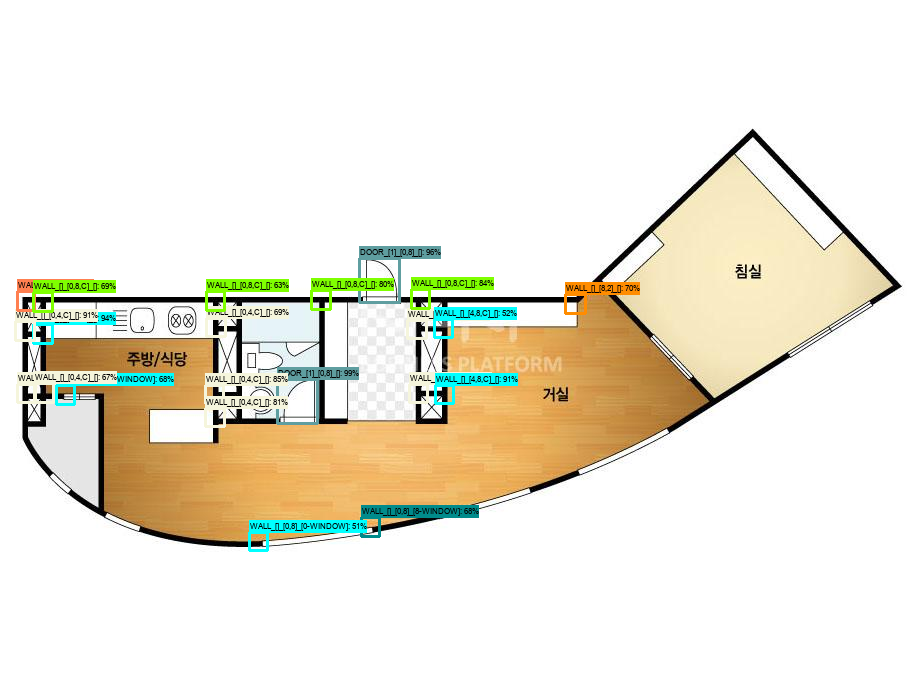

(676, 923, 3)


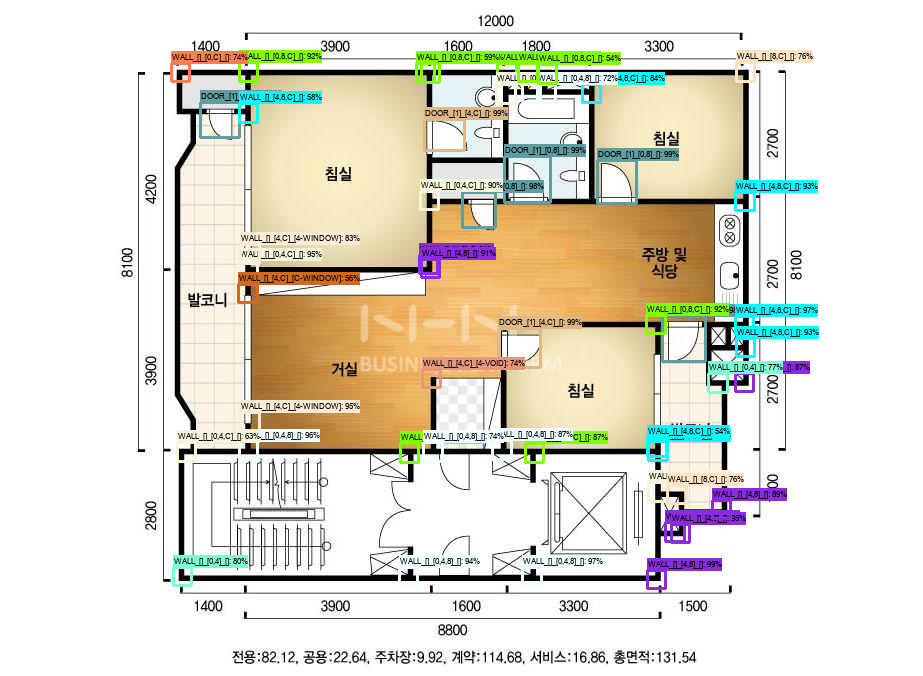

(676, 923, 3)


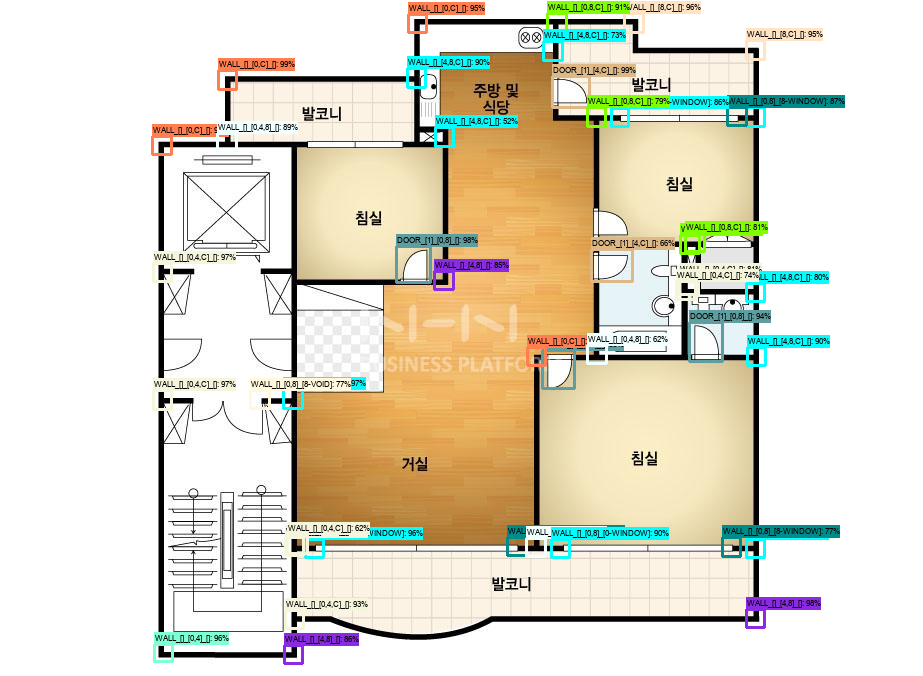

(676, 923, 3)


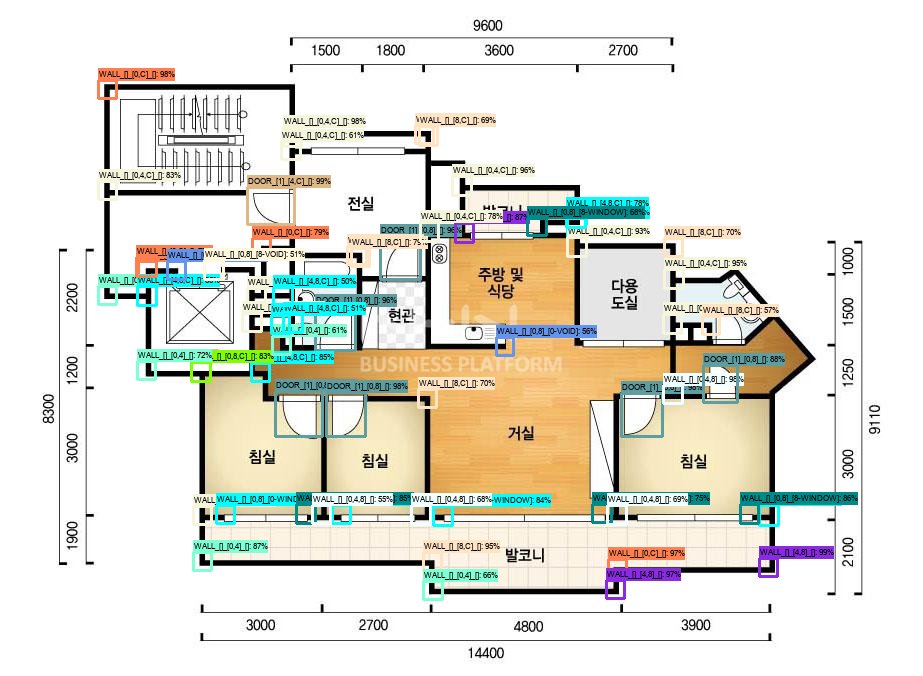

(676, 923, 3)


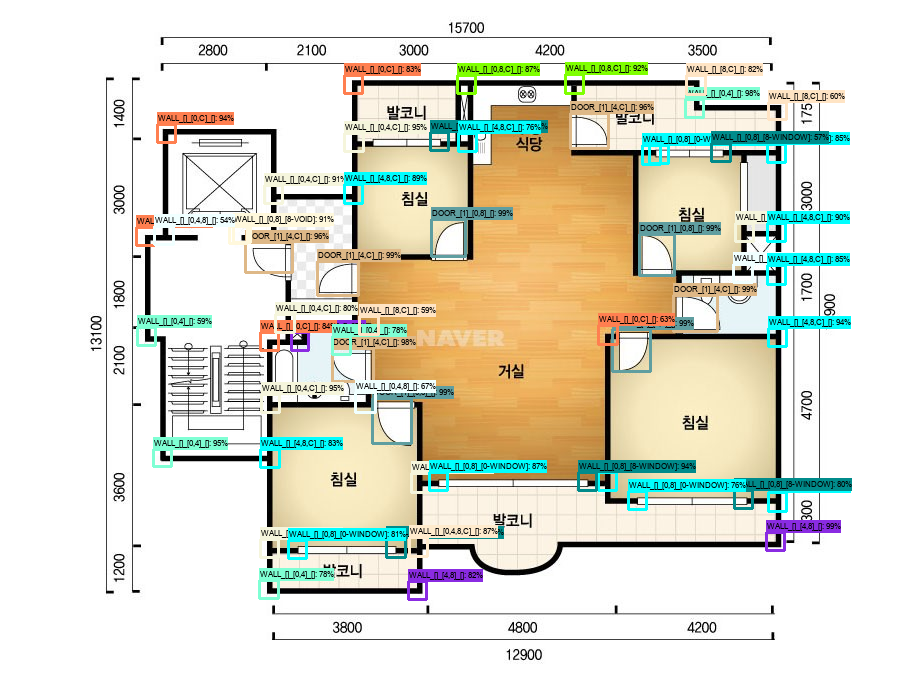

(676, 923, 3)


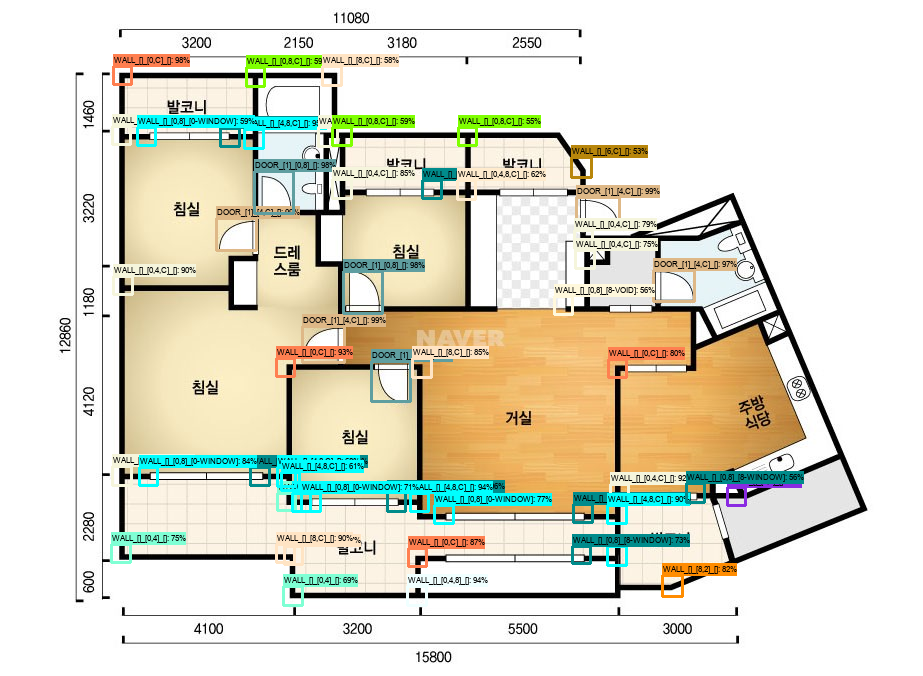

(676, 923, 3)


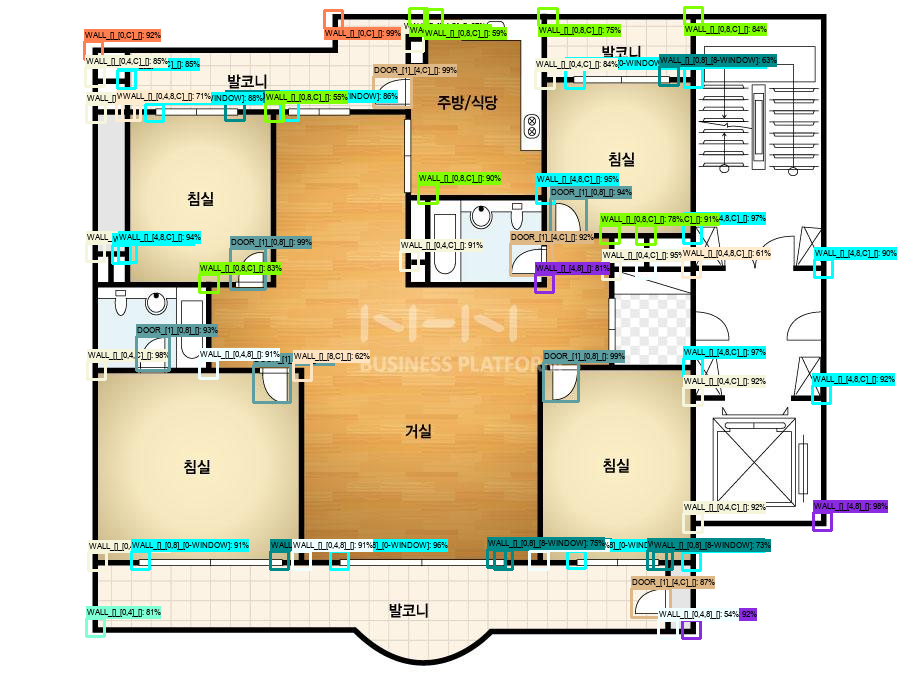

(676, 923, 3)


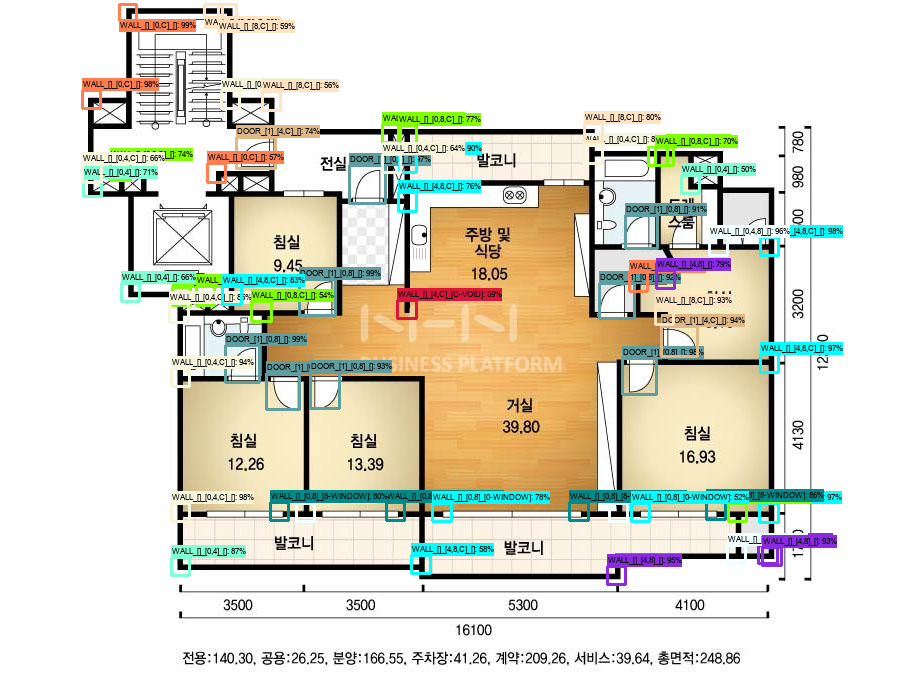

(676, 923, 3)


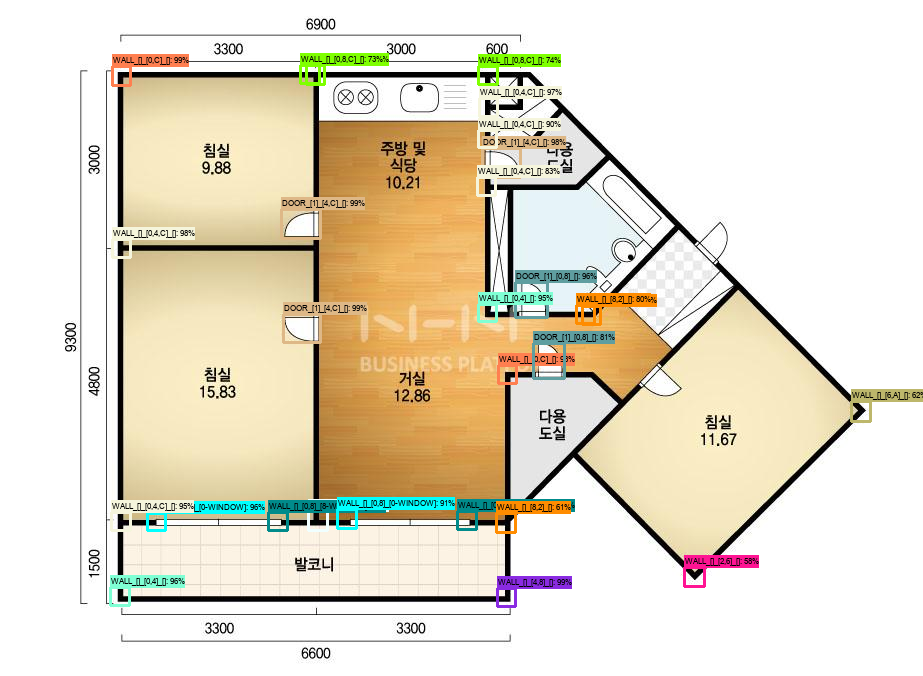

(676, 923, 3)


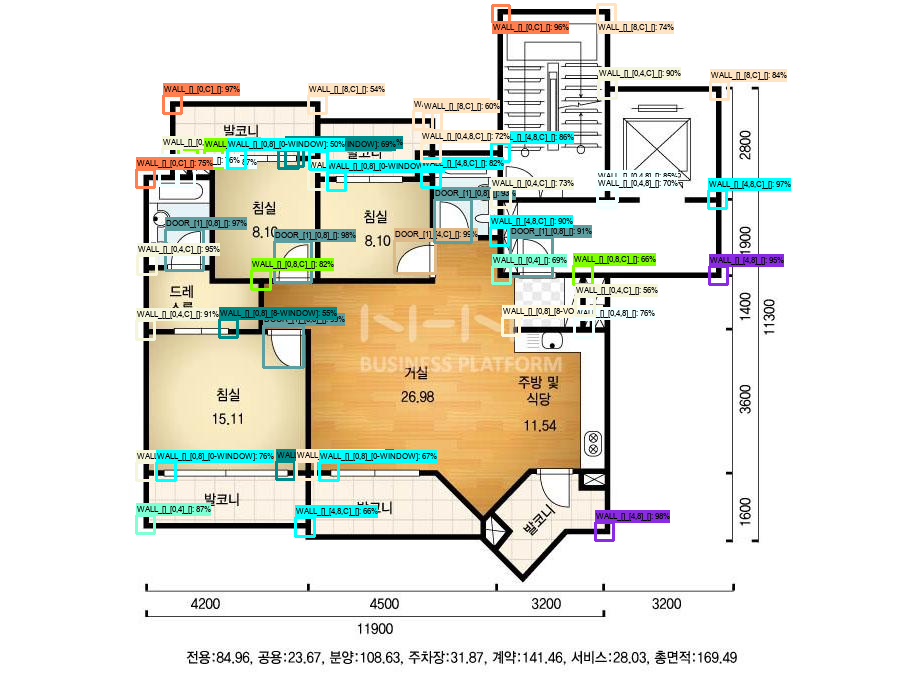

(676, 923, 3)


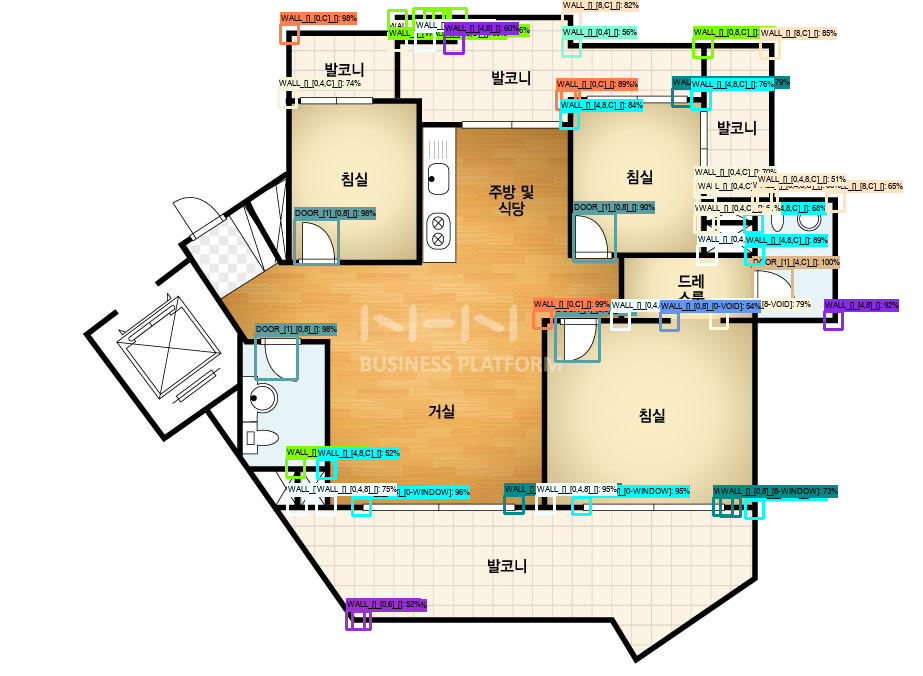

(676, 923, 3)


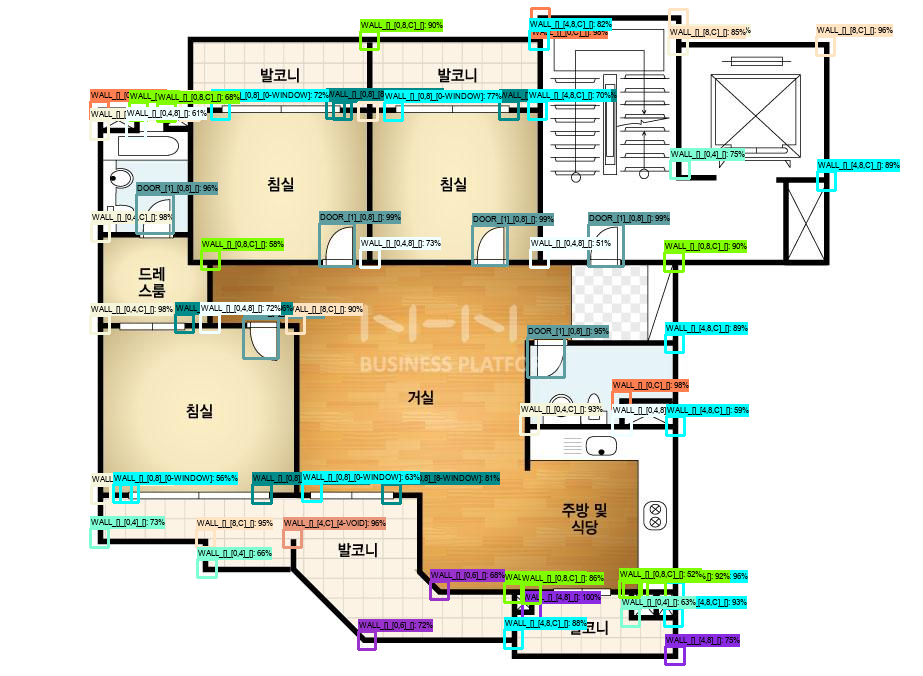

(676, 923, 3)


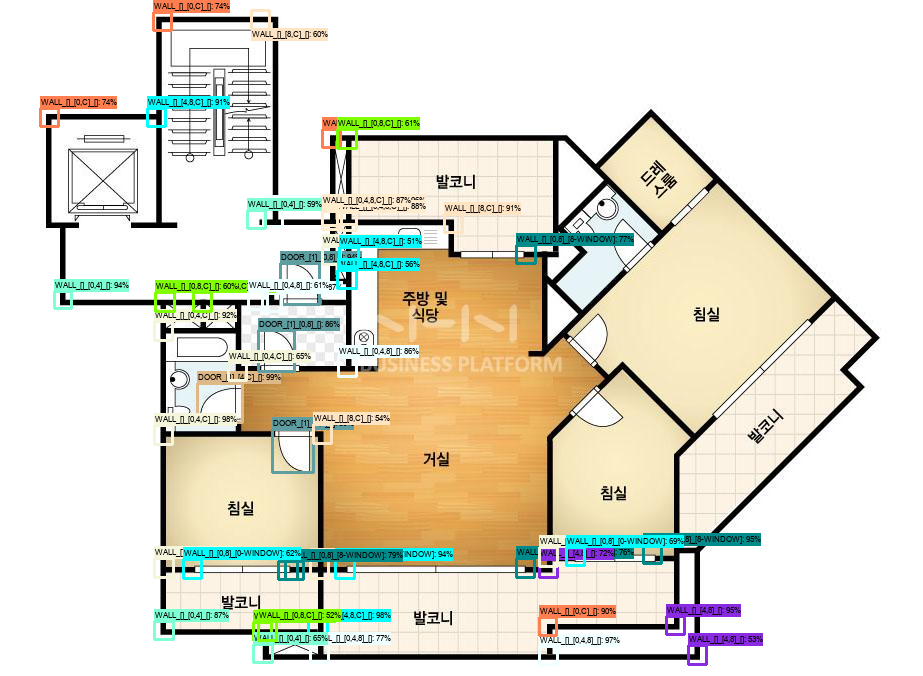

(676, 923, 3)


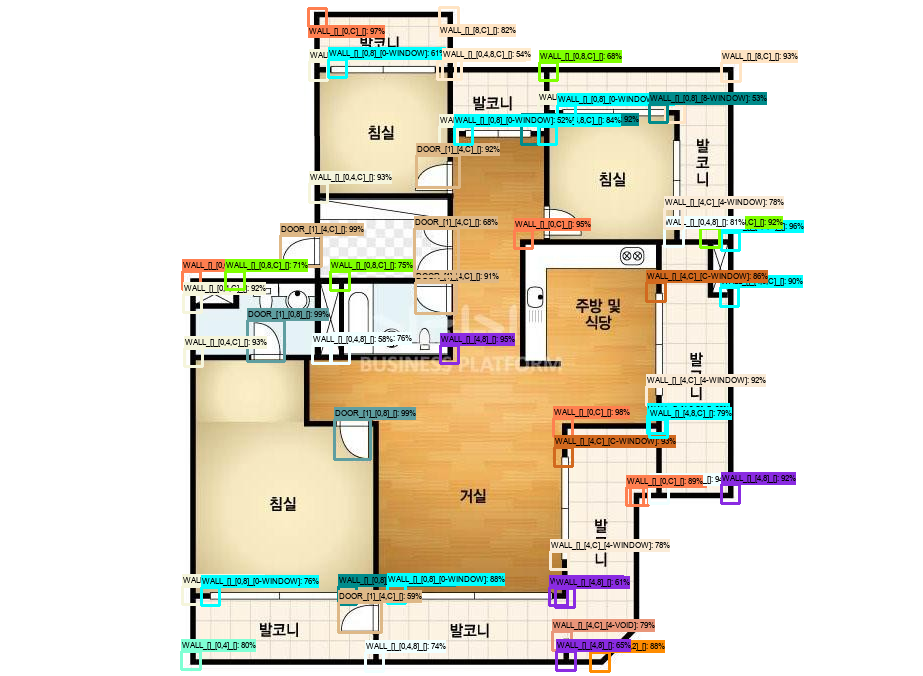

(676, 923, 3)


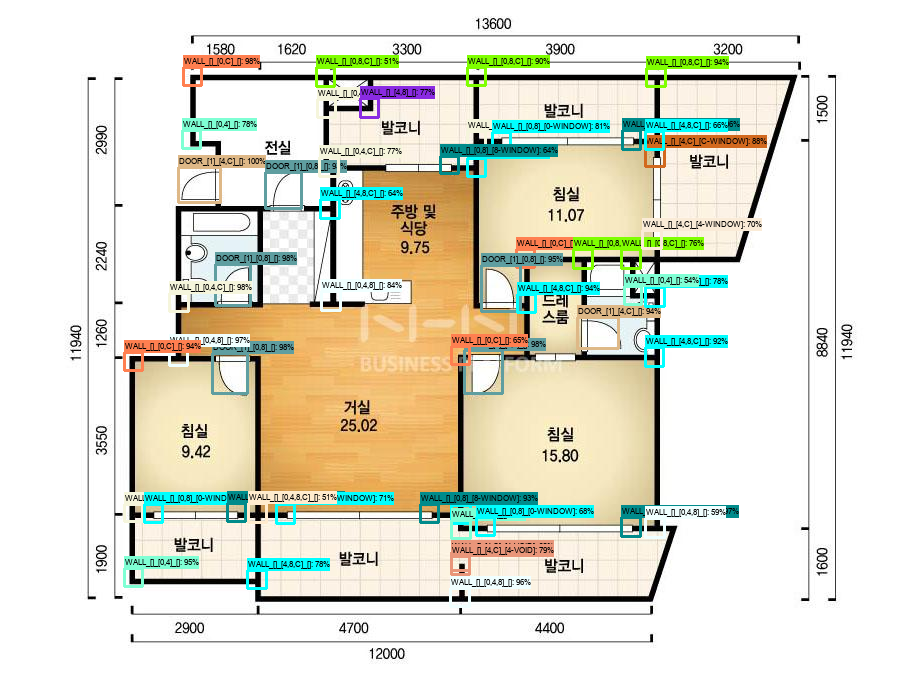

(676, 923, 3)


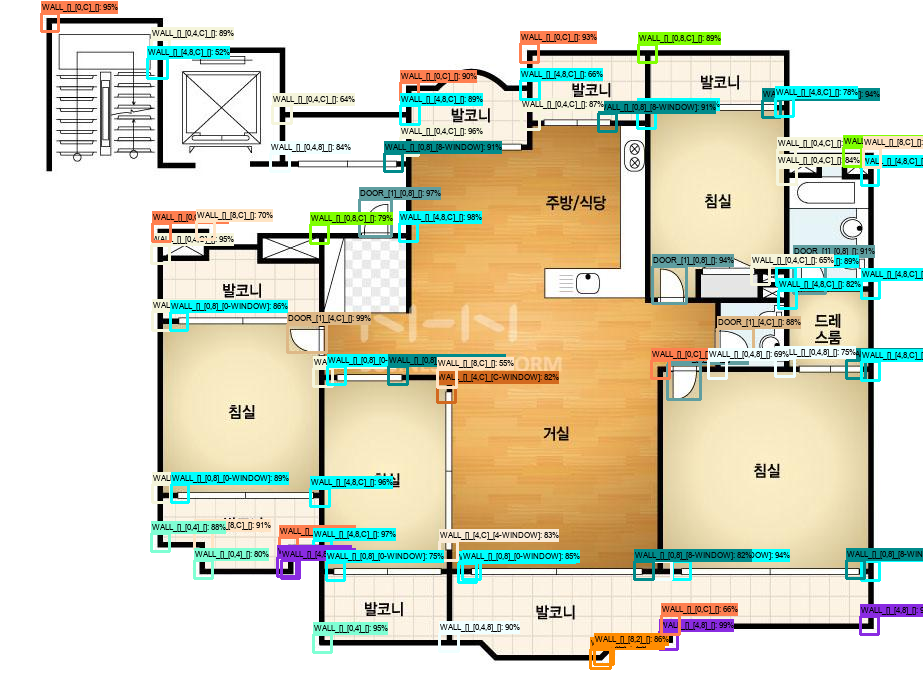

(676, 923, 3)


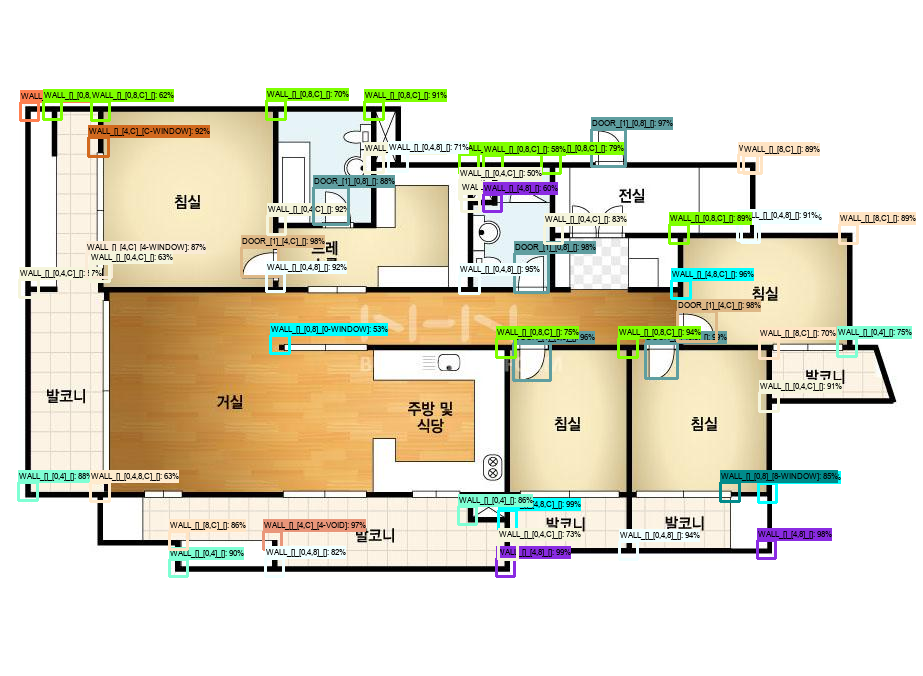

(676, 923, 3)


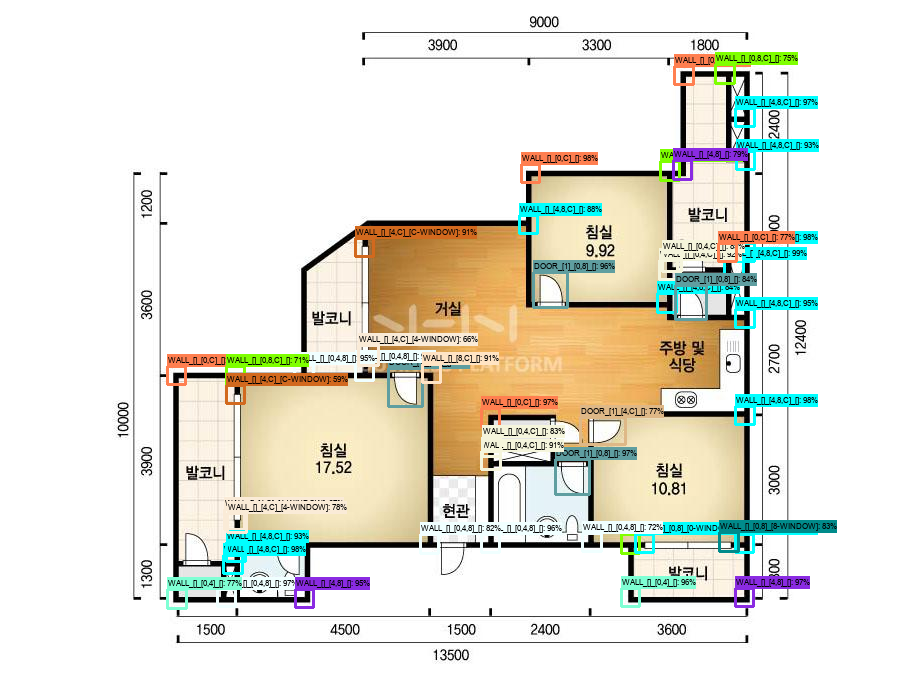

(676, 923, 3)


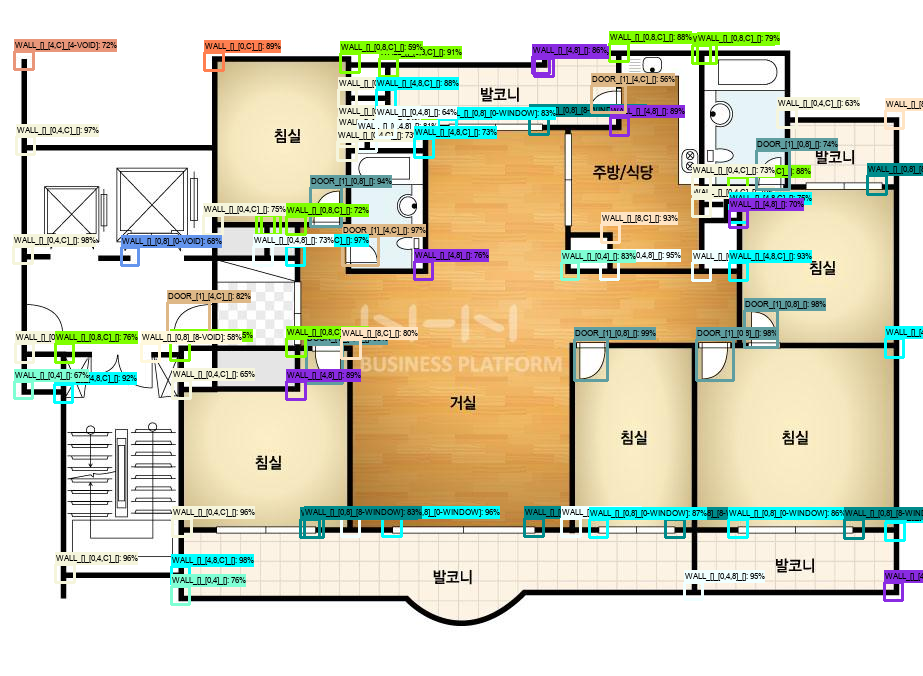

(676, 923, 3)


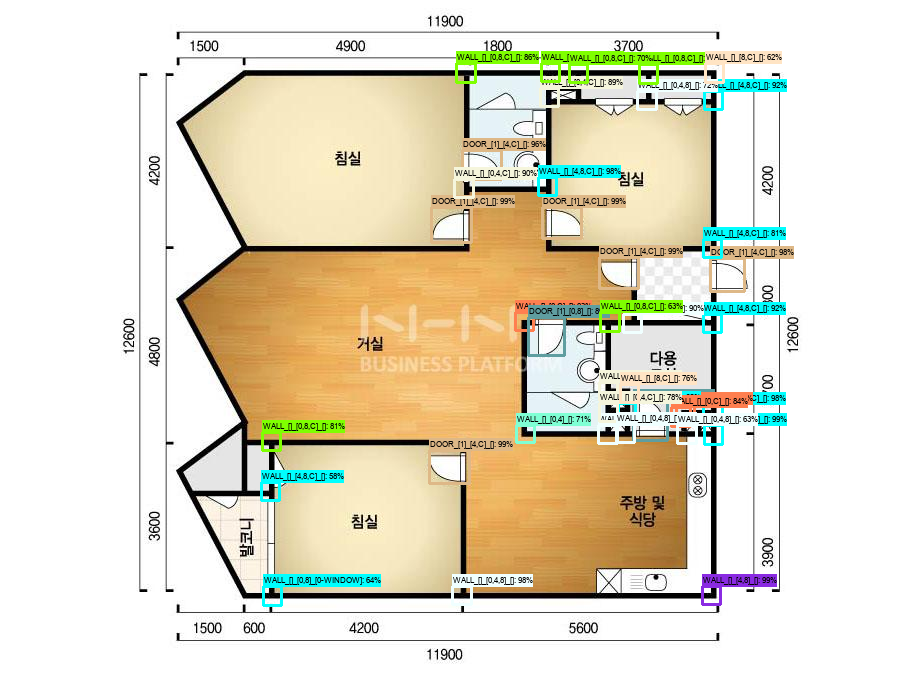

(676, 923, 3)


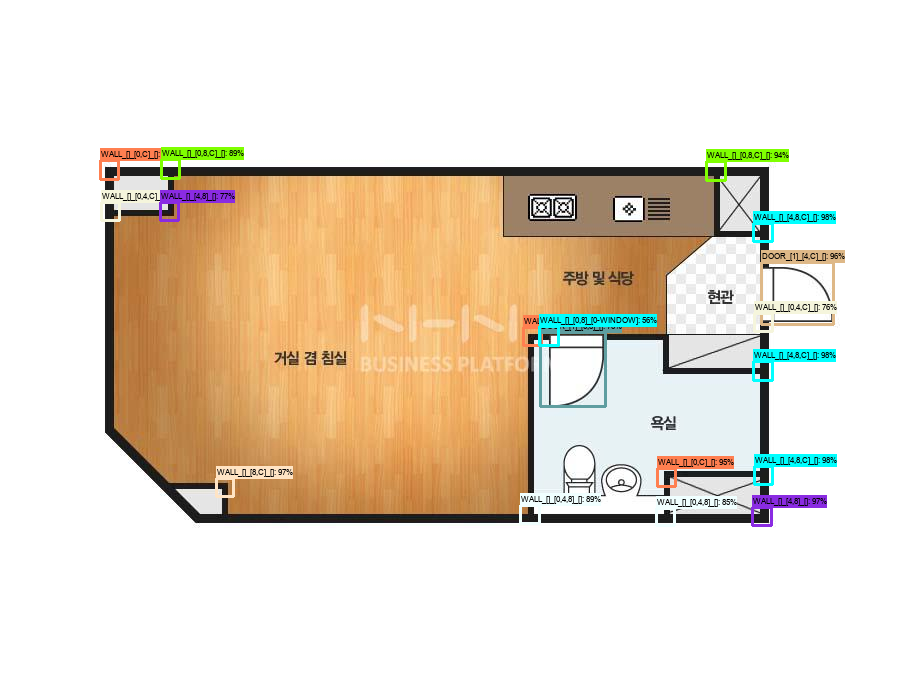

(676, 923, 3)


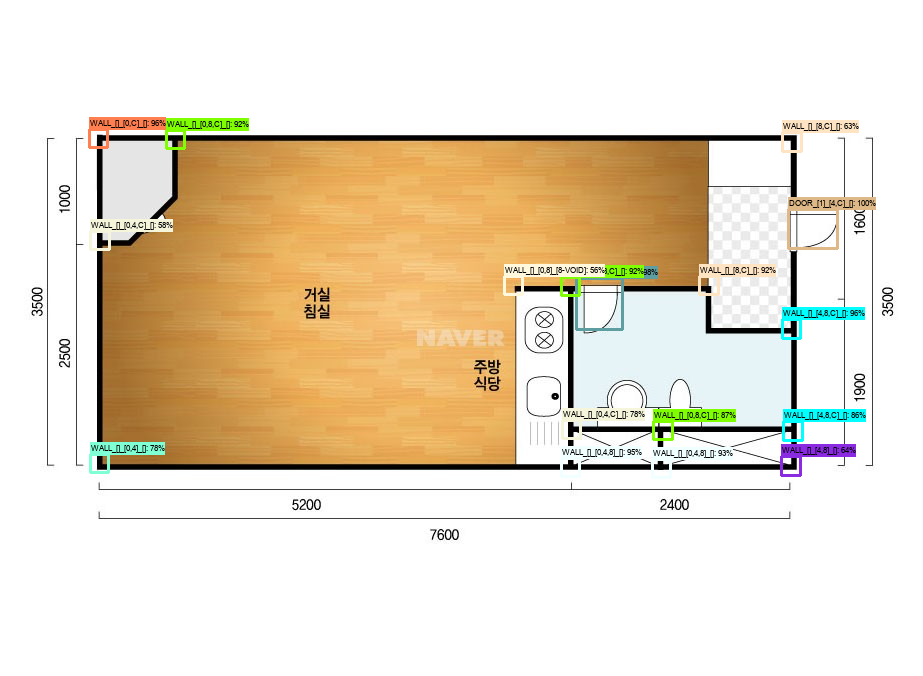

(676, 923, 3)


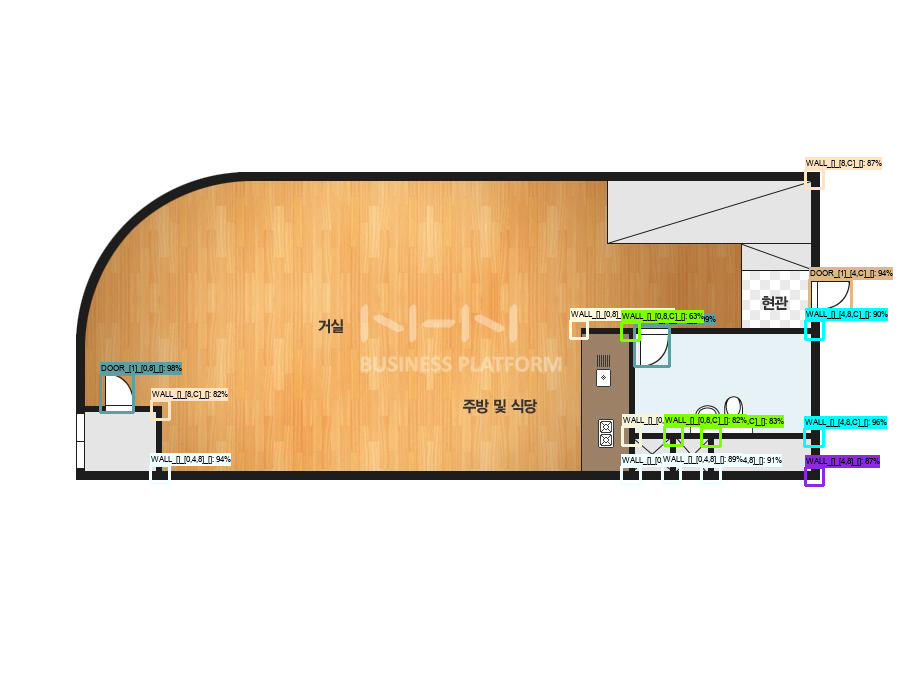

(676, 923, 3)


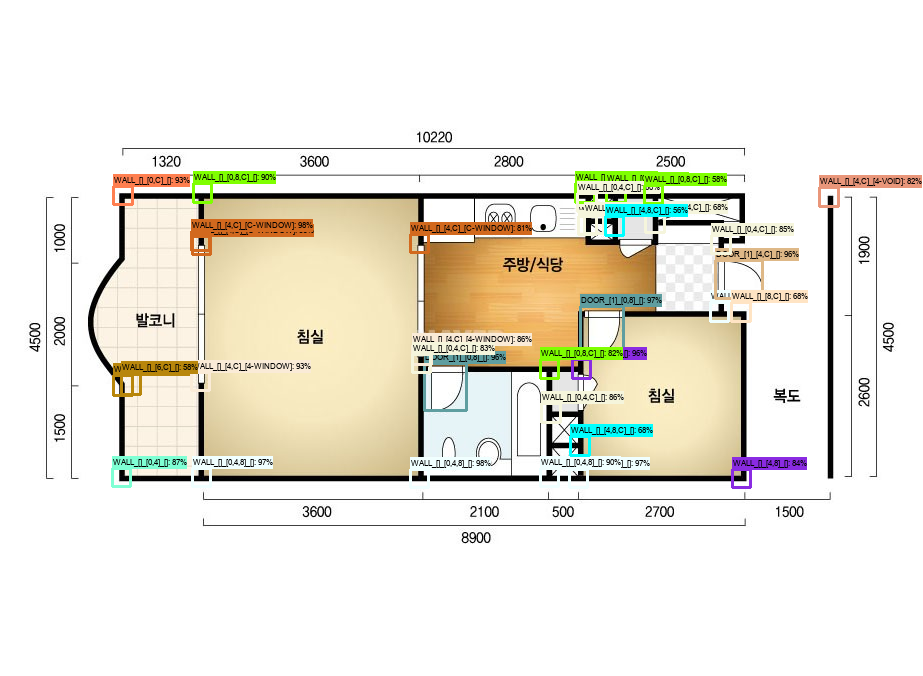

(676, 923, 3)


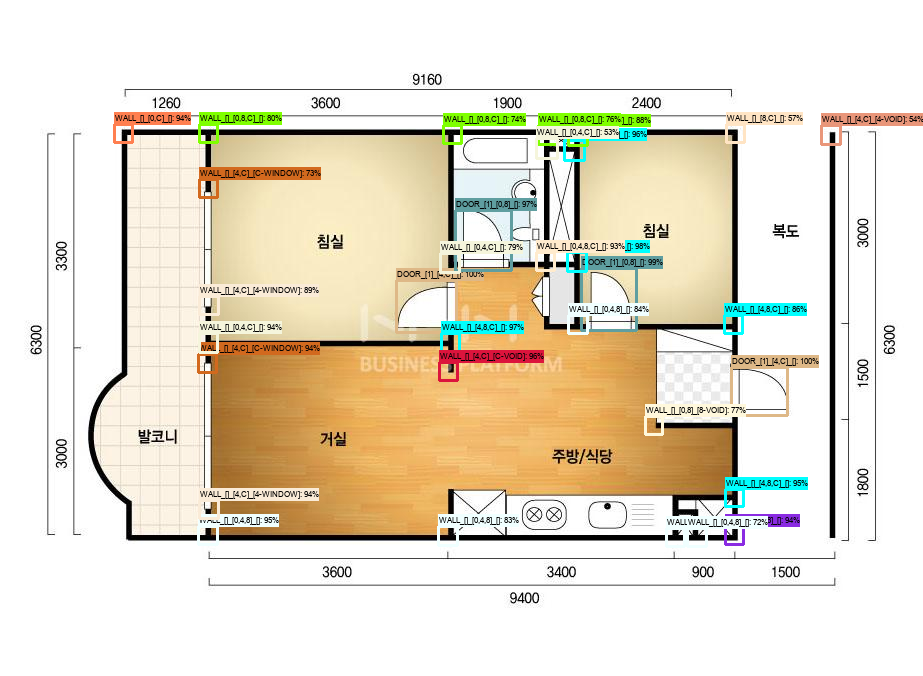

(676, 923, 3)


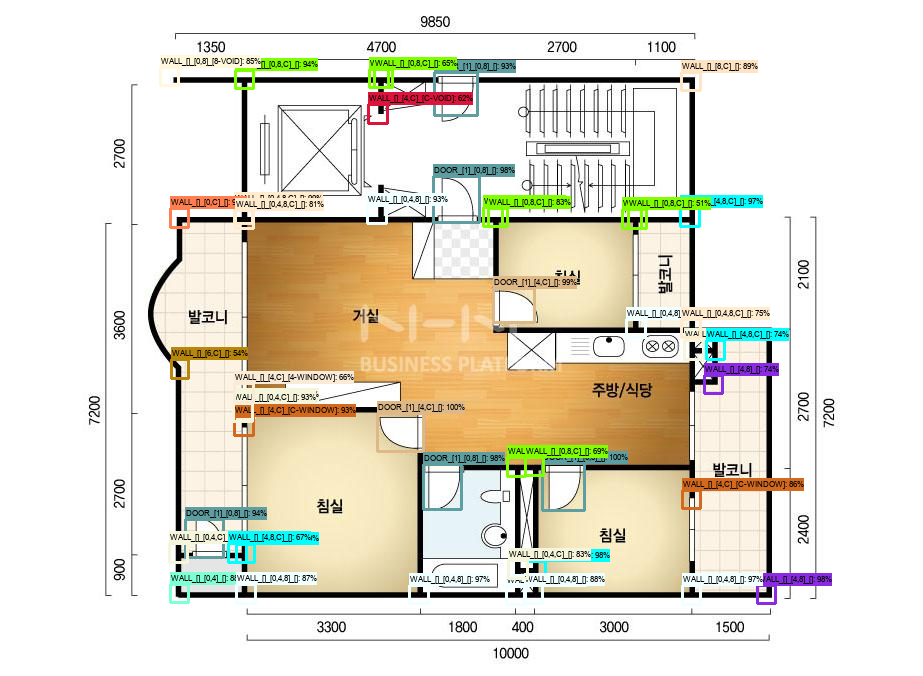

(676, 923, 3)


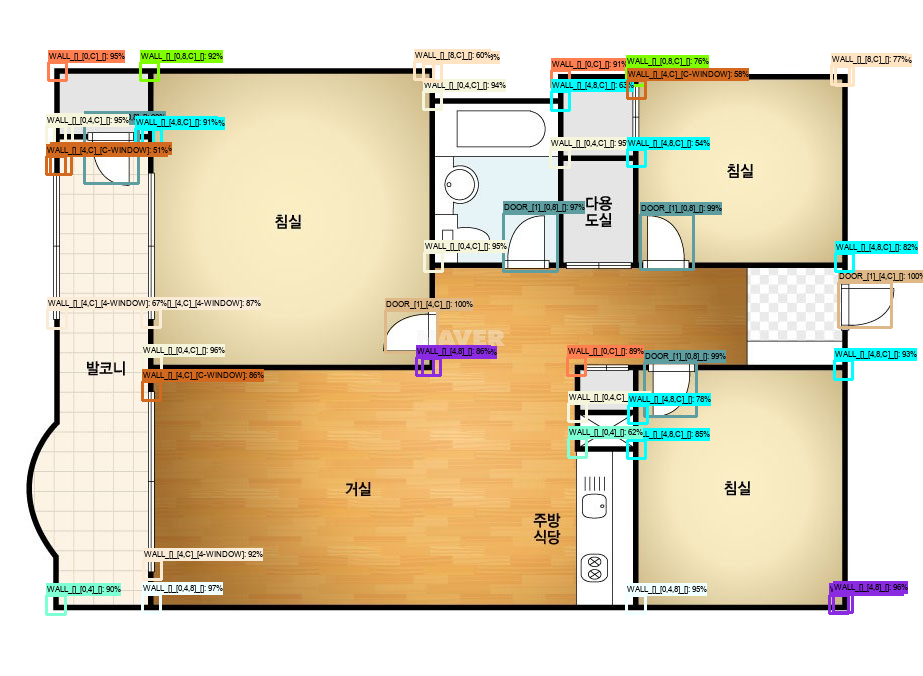

(676, 923, 3)


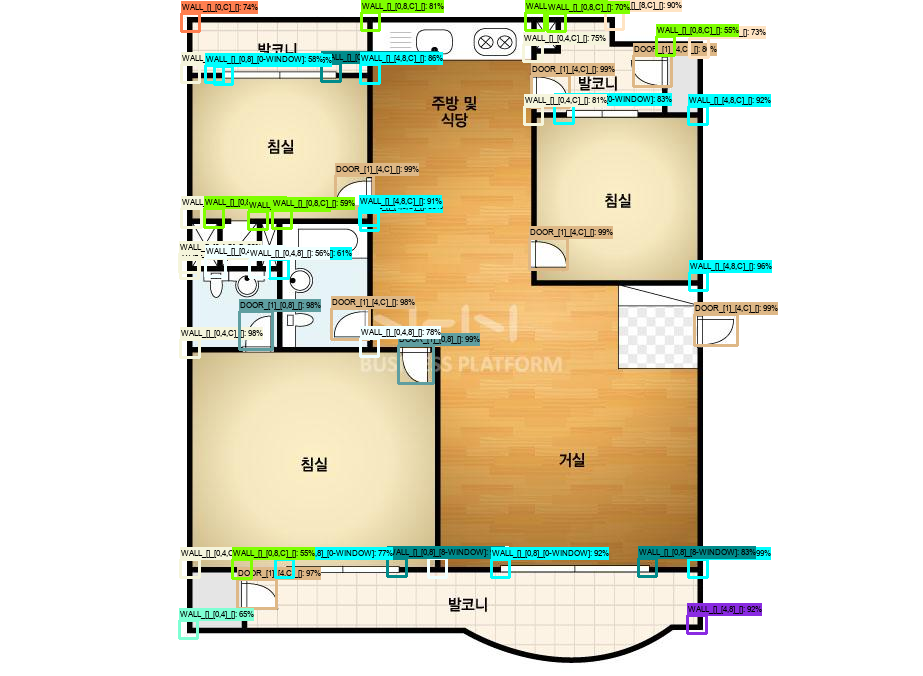

(676, 923, 3)


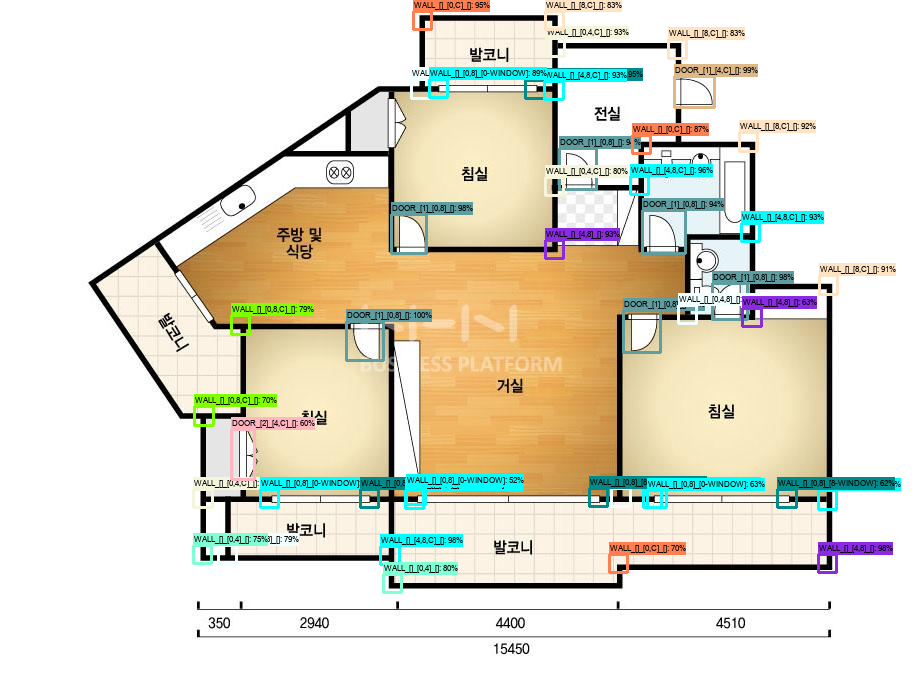

(676, 923, 3)


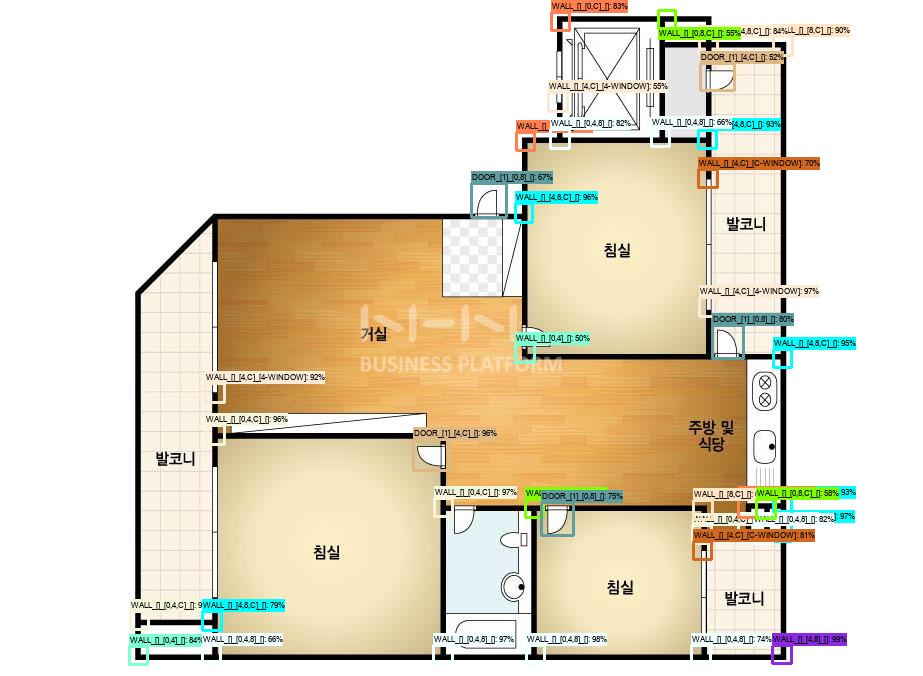

(676, 923, 3)


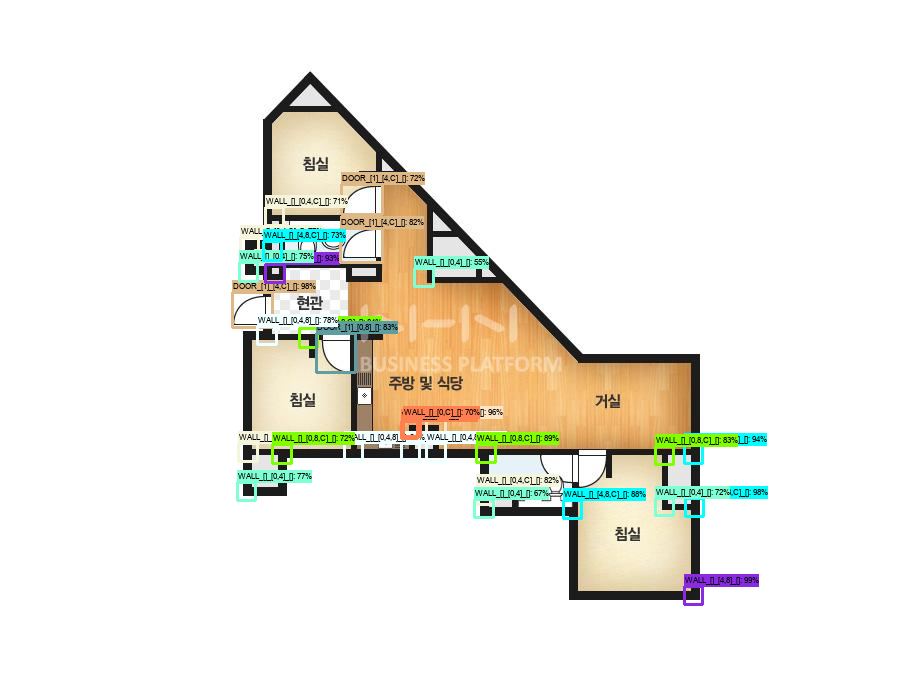

(676, 923, 3)


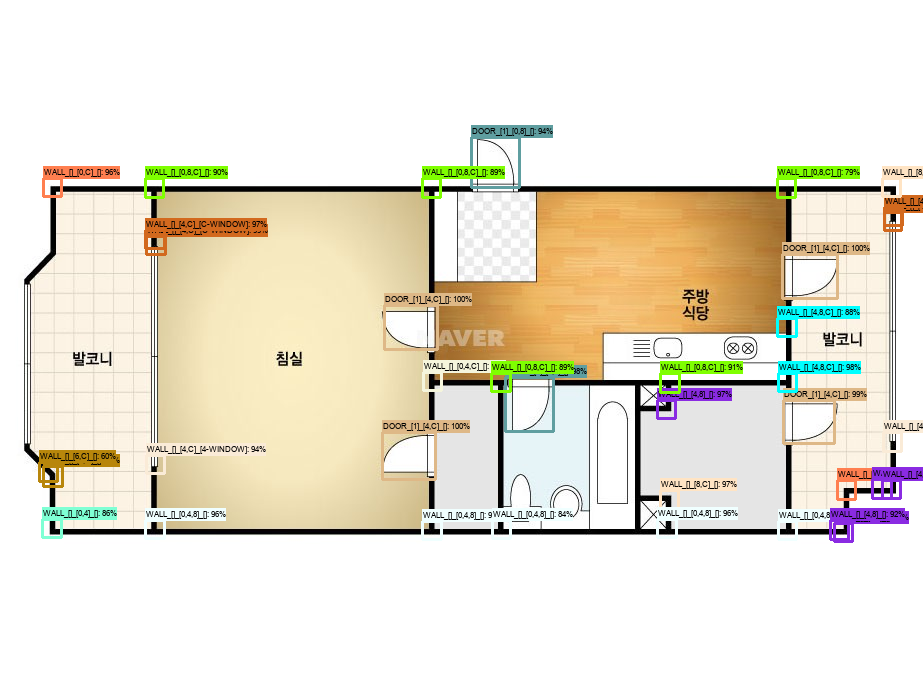

(676, 923, 3)


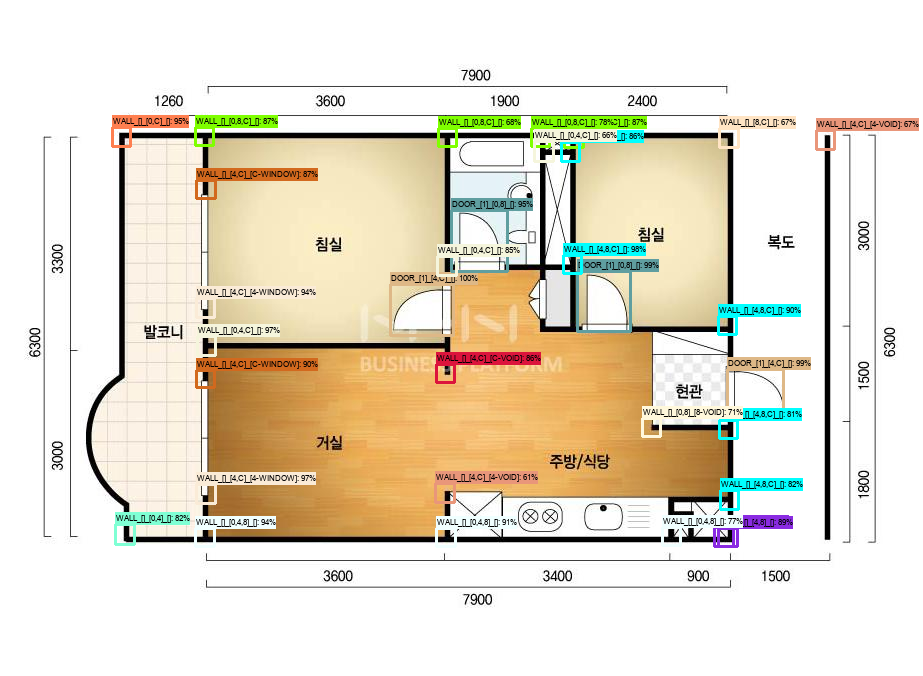

(676, 923, 3)


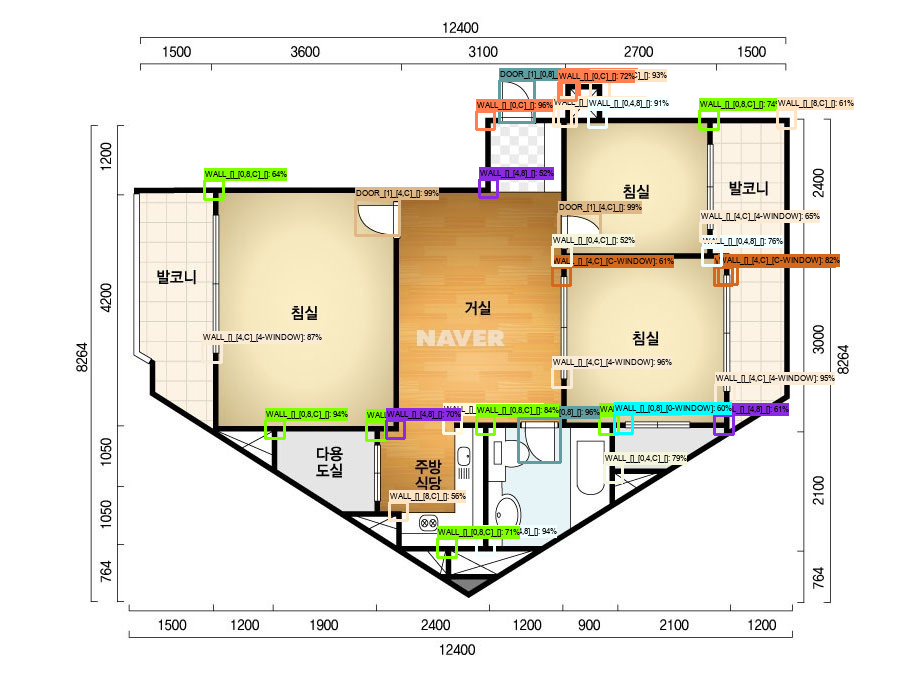

(676, 923, 3)


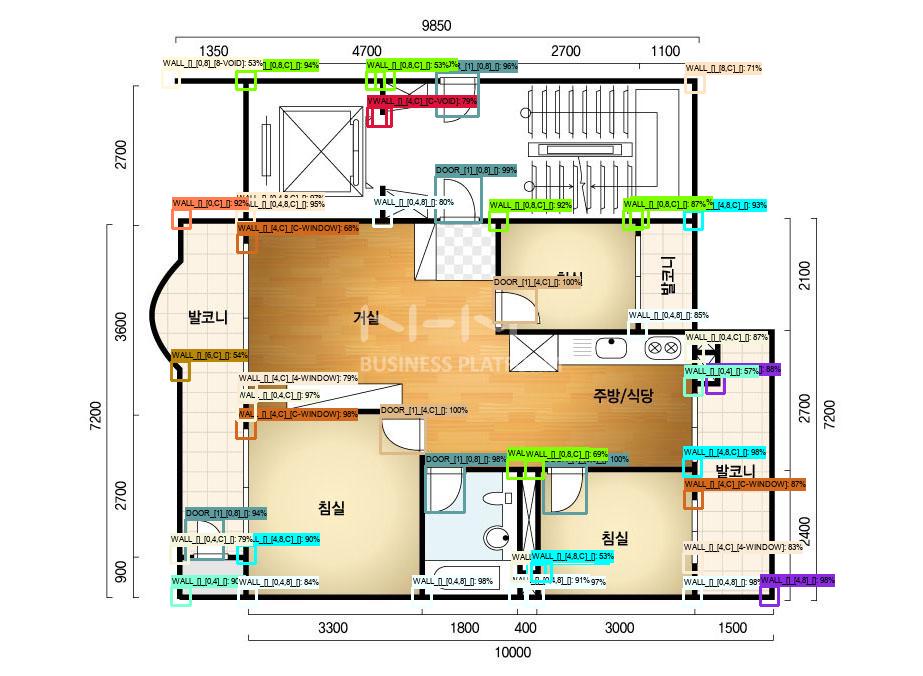

(676, 923, 3)


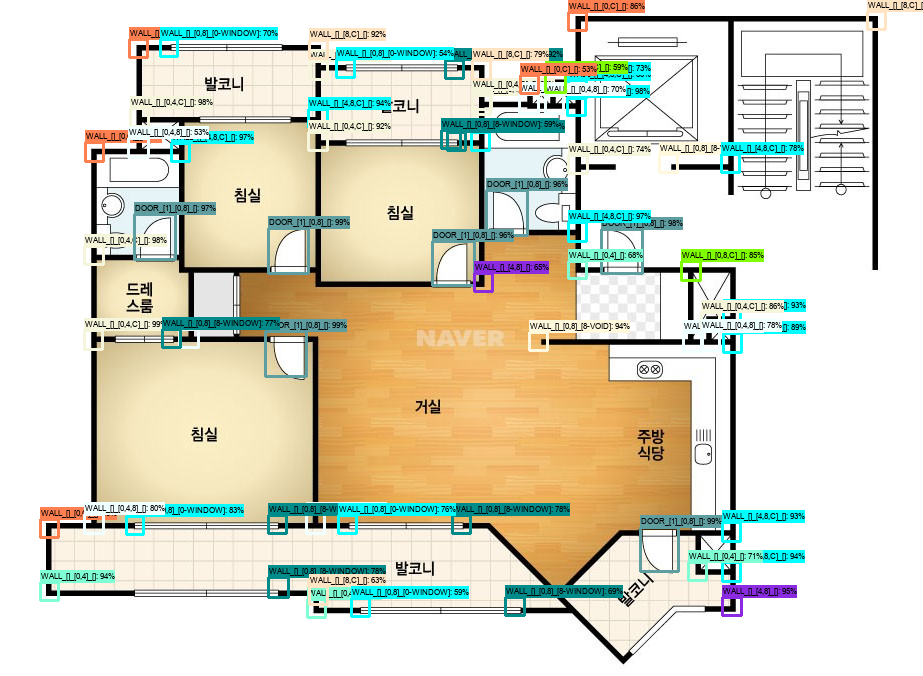

(676, 923, 3)


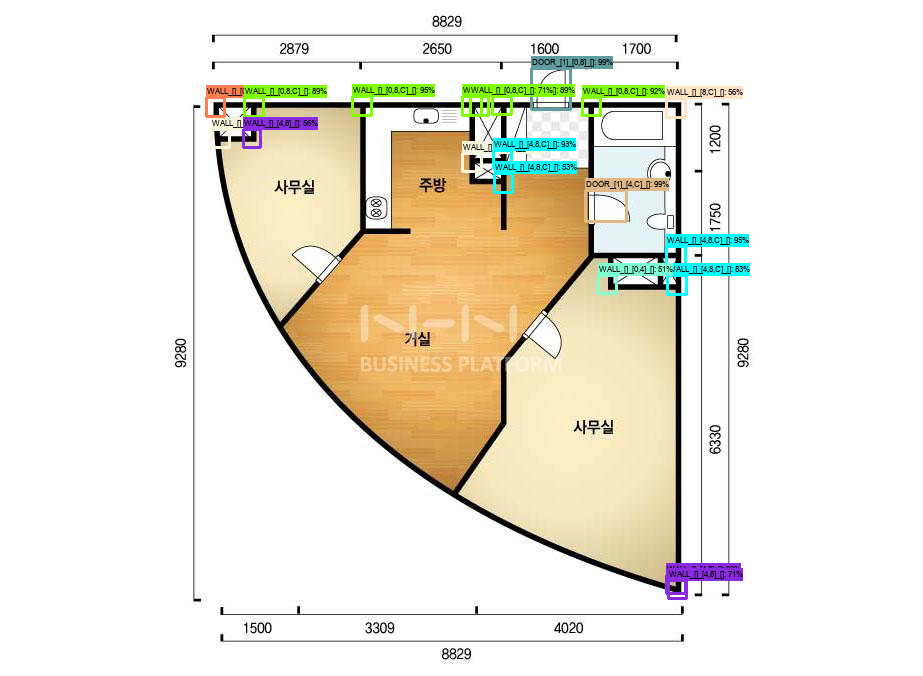

(676, 923, 3)


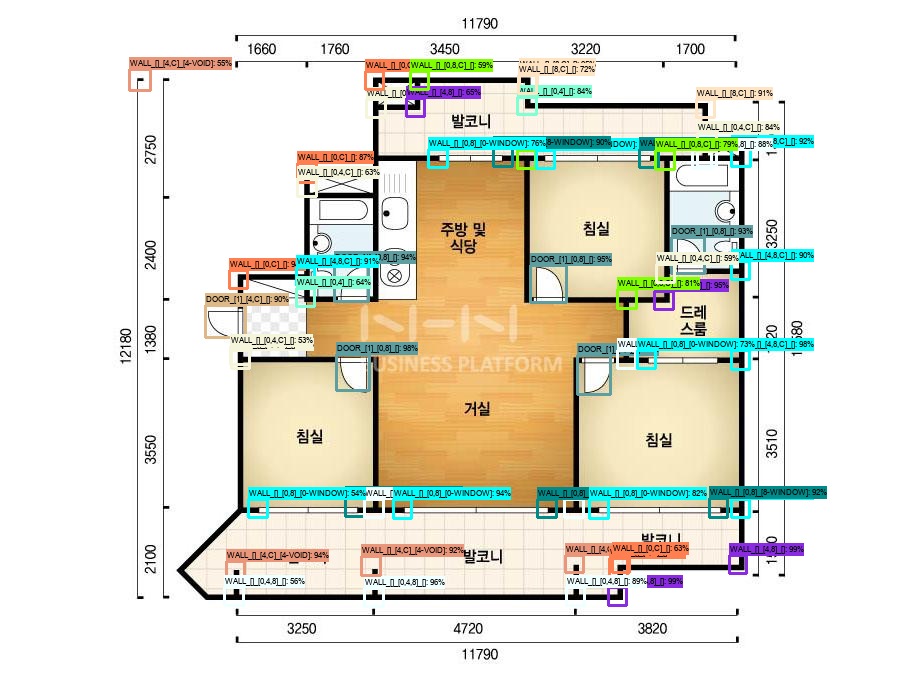

(676, 923, 3)


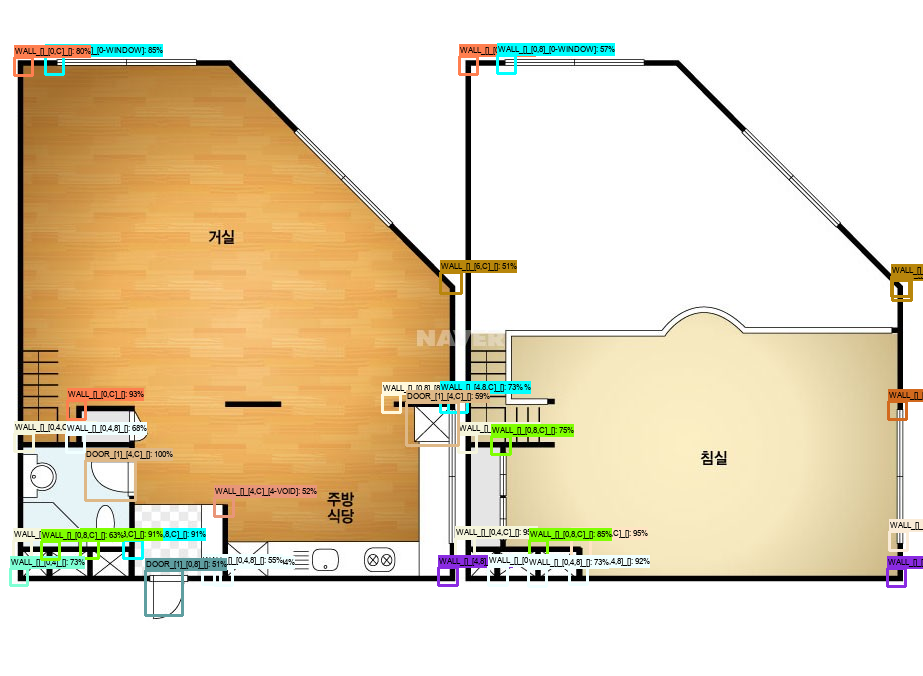

(676, 923, 3)


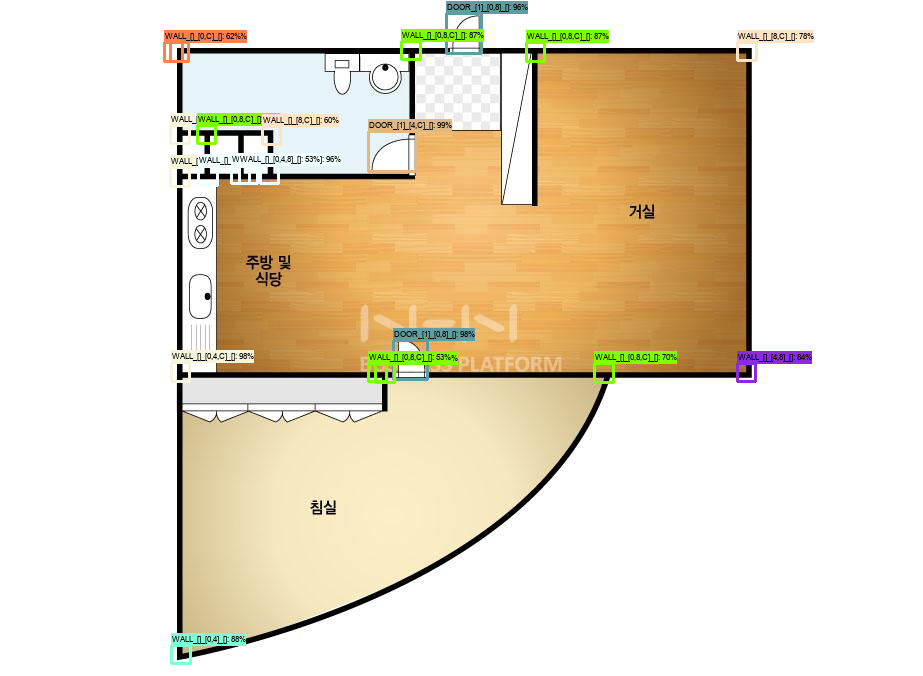

(676, 923, 3)


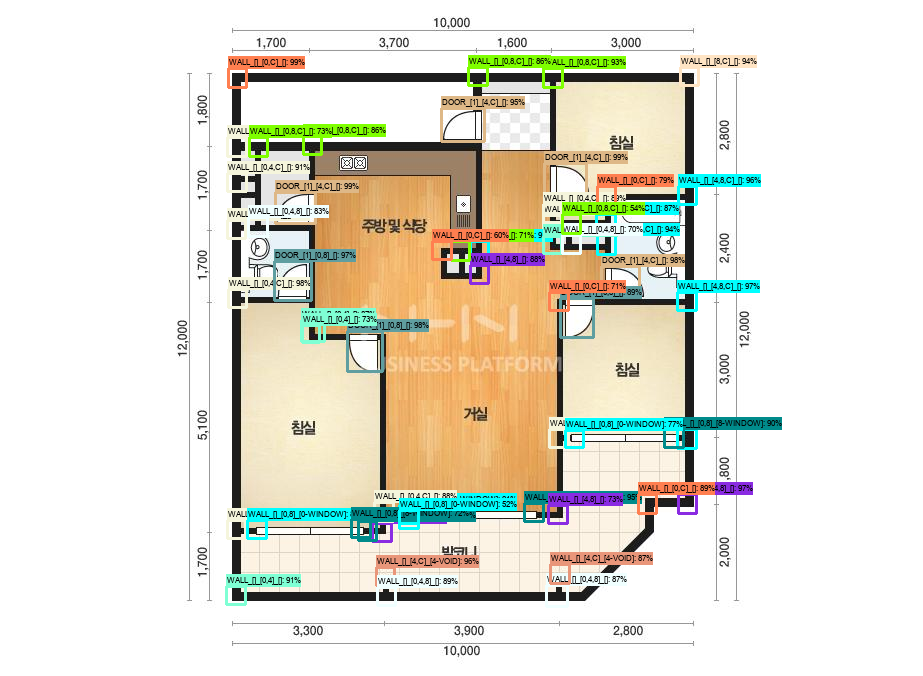

(676, 923, 3)


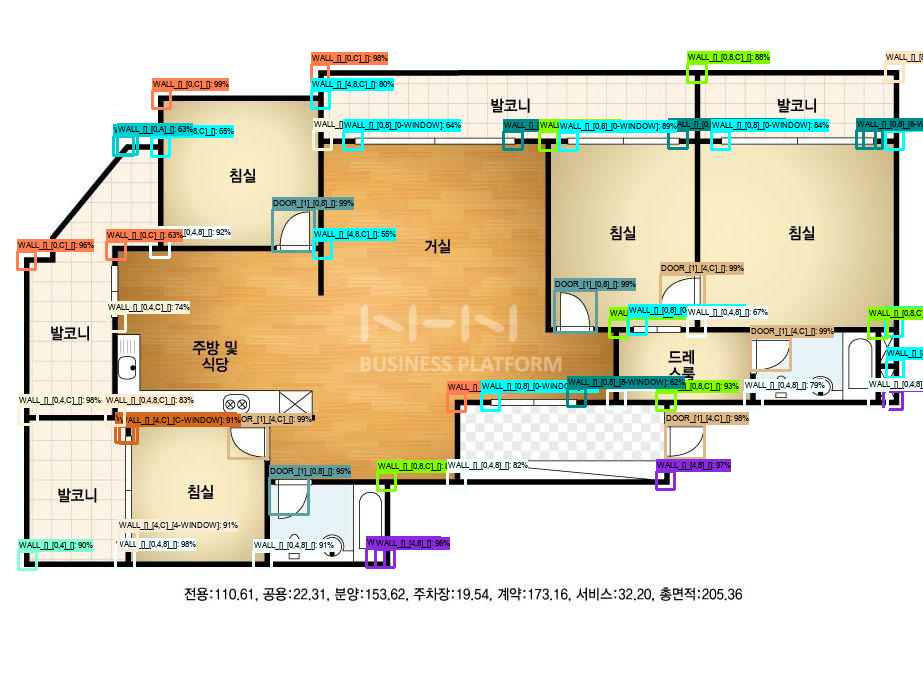

(676, 923, 3)


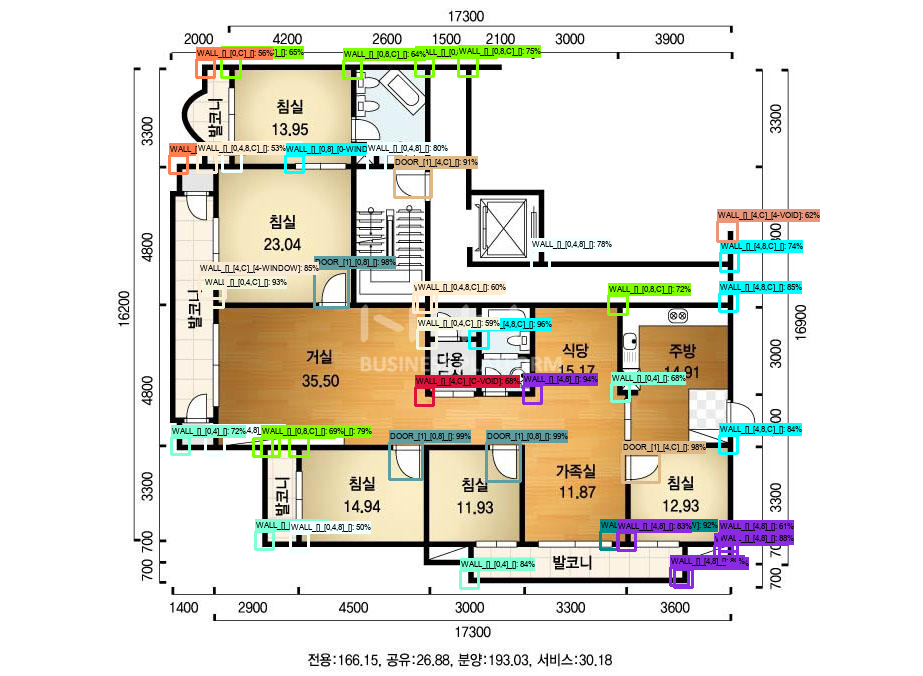

(676, 923, 3)


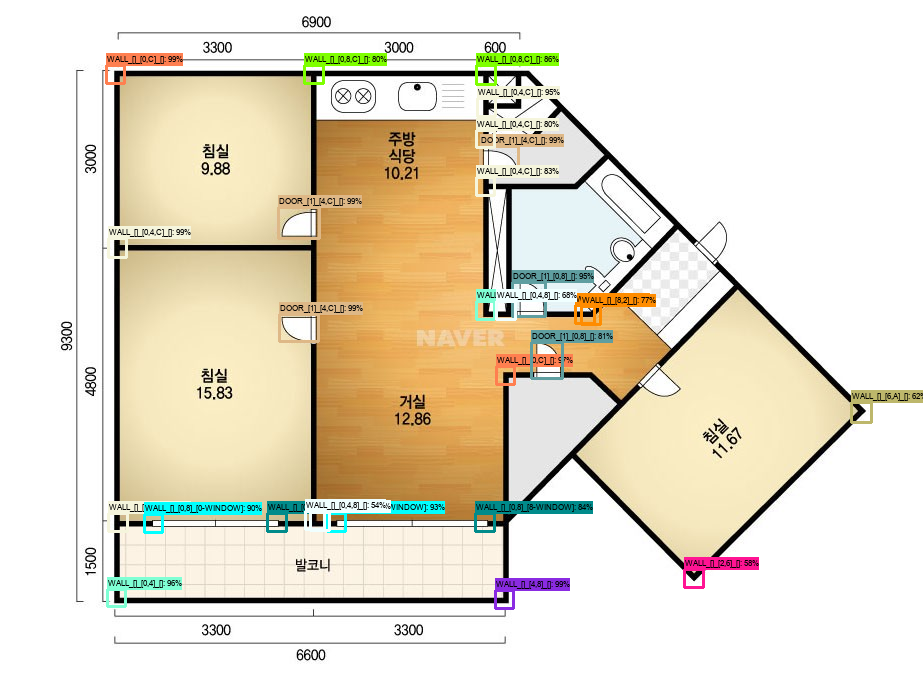

(676, 923, 3)


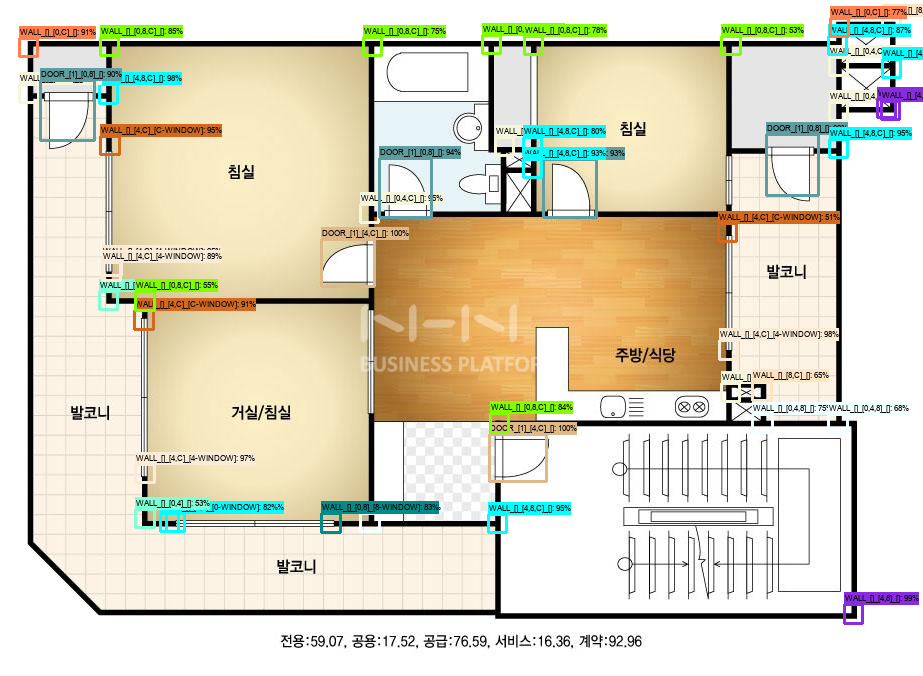

(676, 923, 3)


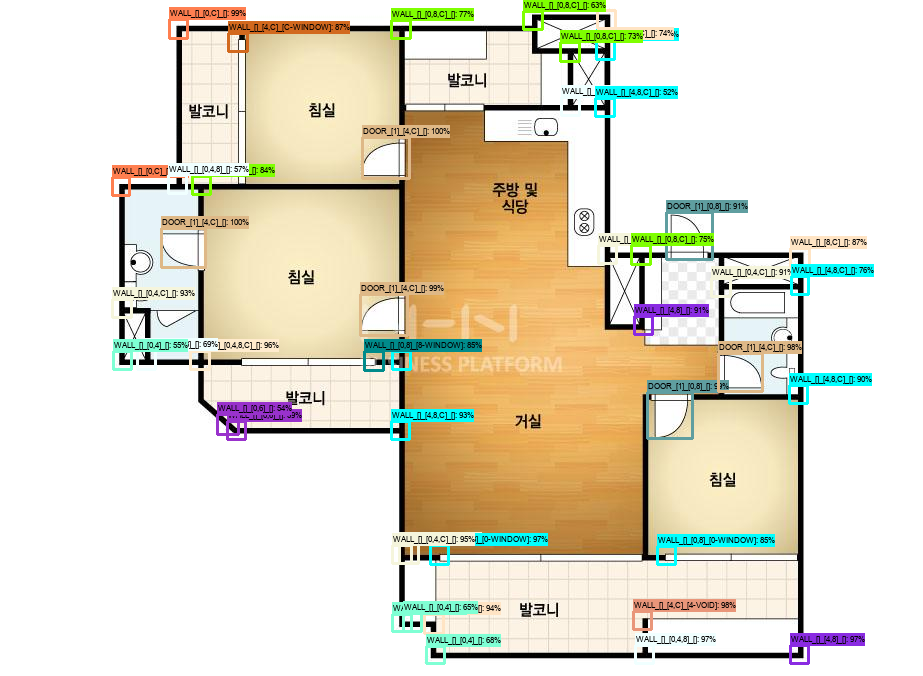

(676, 923, 3)


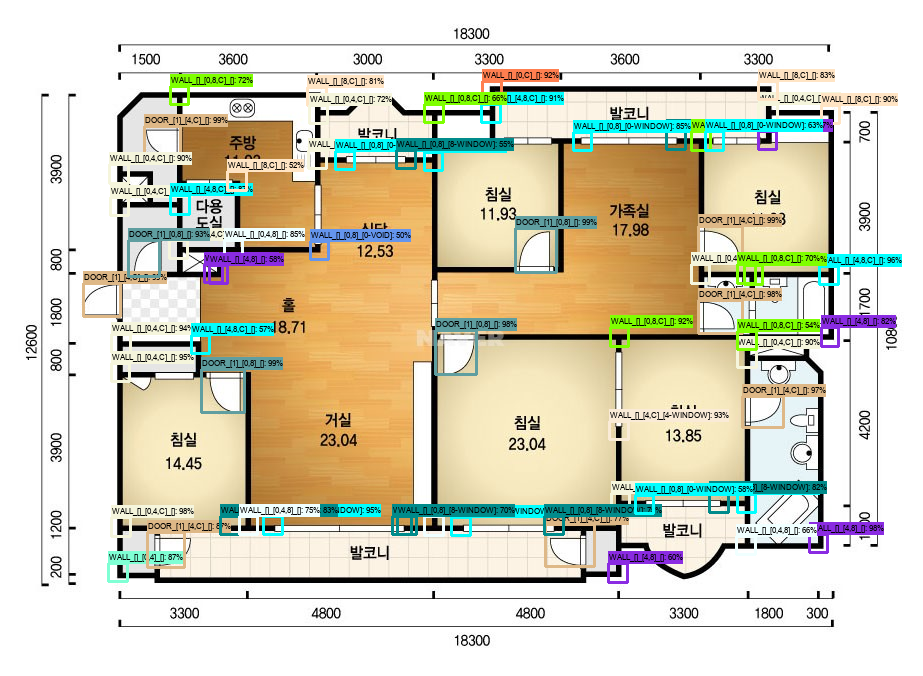

(676, 923, 3)


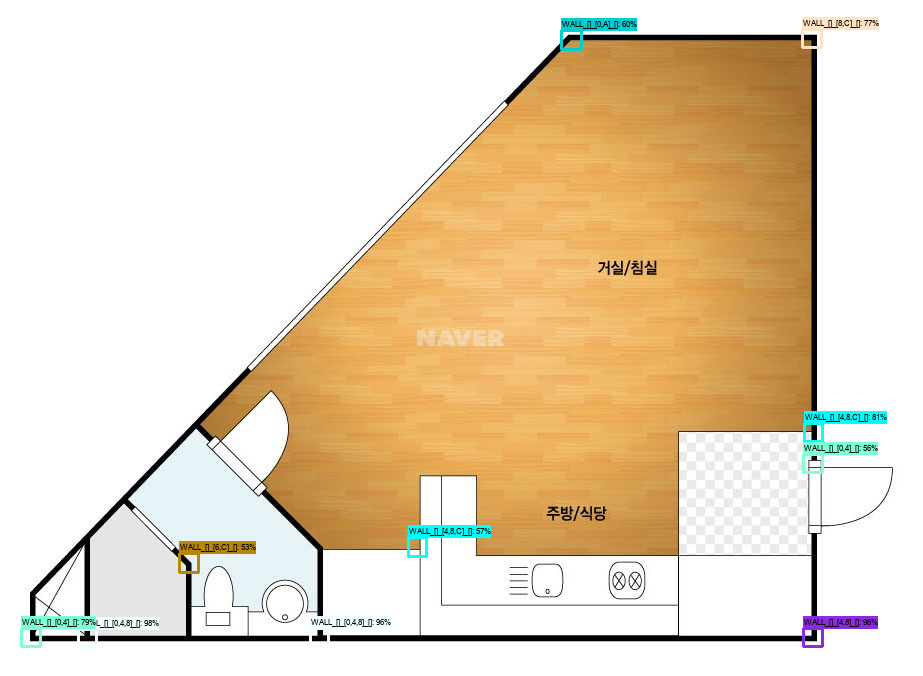

(676, 923, 3)


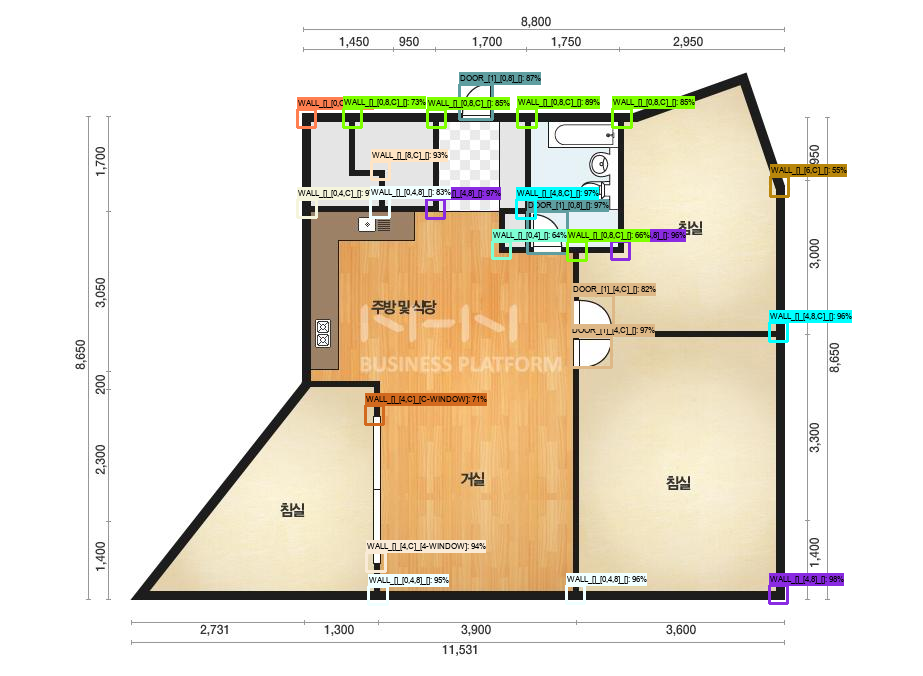

(676, 923, 3)


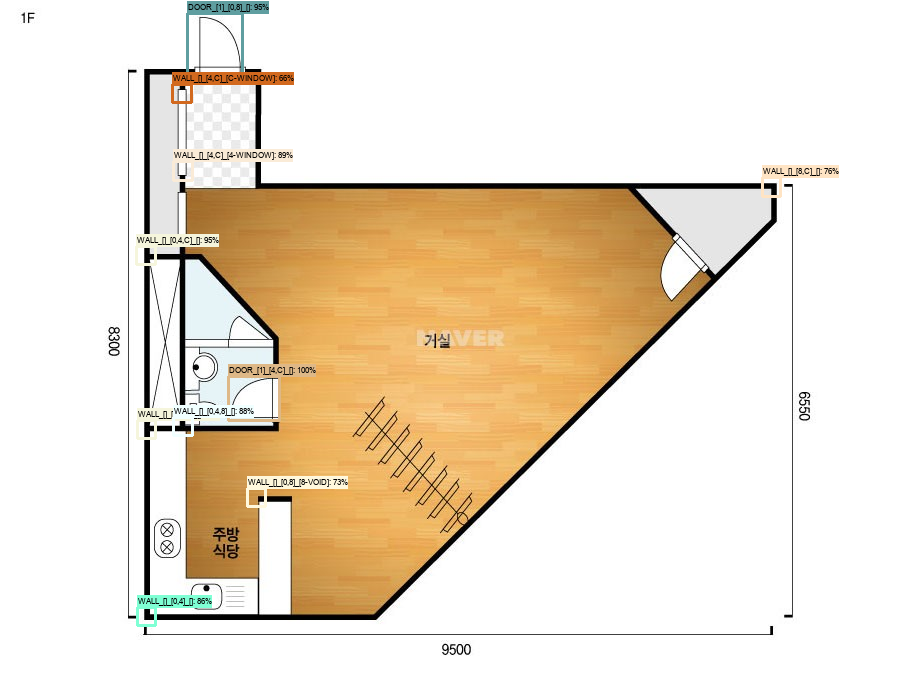

(676, 923, 3)


In [18]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)
